*Installing the Libraries*


In [2]:
%pip install pygwalker
%pip install ydata-profiling
%pip install librosa
%pip install tensorflow

  Using cached ipylab-1.0.0-py3-none-any.whl.metadata (6.7 kB)
  Using cached quickjs-1.19.4.tar.gz (456 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
Using cached ipylab-1.0.0-py3-none-any.whl (100 kB)
  Running setup.py clean for quickjs
Failed to build quickjs
Note: you may need to restart the kernel to use updated packages.


  DEPRECATION: Building 'quickjs' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'quickjs'. Discussion can be found at https://github.com/pypa/pip/issues/6334
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [15 lines of output]
      running bdist_wheel
      running build
      running build_py
      creating build
      creating build\lib.win-amd64-cpython-313
      creating build\lib.win-amd64-cpython-313\quickjs
      copying quickjs\__init__.py -> build\lib.win-amd64-cpython-313\quickjs
      running build_ext
      building '_quickjs' extension
      creating build\temp.win-amd64-cpython-313
      creating build\t

Note: you may need to restart the kernel to use updated packages.


ERROR: Ignored the following versions that require a different python version: 4.0.0 Requires-Python >=3.7, <3.11; 4.1.0 Requires-Python >=3.7, <3.12; 4.1.1 Requires-Python >=3.7, <3.12; 4.1.2 Requires-Python >=3.7, <3.12; 4.10.0 Requires-Python <3.13,>=3.7; 4.11.0 Requires-Python <3.13,>=3.7; 4.12.0 Requires-Python <3.13,>=3.7; 4.12.1 Requires-Python <3.13,>=3.7; 4.12.2 Requires-Python <3.13,>=3.7; 4.13.0 Requires-Python <3.13,>=3.7; 4.14.0 Requires-Python <3.13,>=3.7; 4.15.0 Requires-Python <3.13,>=3.7; 4.15.1 Requires-Python <3.13,>=3.7; 4.16.0 Requires-Python <3.13,>=3.7; 4.16.1 Requires-Python <3.13,>=3.7; 4.2.0 Requires-Python >=3.7, <3.12; 4.3.0 Requires-Python >=3.7, <3.12; 4.3.1 Requires-Python >=3.7, <3.12; 4.3.2 Requires-Python >=3.7, <3.12; 4.4.0 Requires-Python >=3.7, <3.12; 4.5.0 Requires-Python >=3.7, <3.12; 4.5.1 Requires-Python >=3.7, <3.12; 4.6.0 Requires-Python >=3.7, <3.12; 4.6.1 Requires-Python >=3.7, <3.12; 4.6.2 Requires-Python >=3.7, <3.12; 4.6.3 Requires-Python

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import ydata_profiling

ModuleNotFoundError: No module named 'ydata_profiling'

In [4]:
Input_path = 'D:/Project/AI_ML_Projects/EMG Classification/dataset/EMG-data.csv'
df = pd.read_csv(Input_path)
print(df.head())
print(df.shape)

   time  channel1  channel2  channel3  channel4  channel5  channel6  channel7  \
0     1   0.00001  -0.00002  -0.00001  -0.00003   0.00000  -0.00001   0.00000   
1     5   0.00001  -0.00002  -0.00001  -0.00003   0.00000  -0.00001   0.00000   
2     6  -0.00001   0.00001   0.00002   0.00000   0.00001  -0.00002  -0.00001   
3     7  -0.00001   0.00001   0.00002   0.00000   0.00001  -0.00002  -0.00001   
4     8  -0.00001   0.00001   0.00002   0.00000   0.00001  -0.00002  -0.00001   

   channel8  class  label  
0  -0.00001      0      1  
1  -0.00001      0      1  
2   0.00001      0      1  
3   0.00001      0      1  
4   0.00001      0      1  
(4237907, 11)


In [5]:
print("class :", df["class"].unique())
print()
print("Labels :",df["label"].unique()) # 36 people hand gesture data
print()
print("Value Count :\n",df["class"].value_counts())

class : [0 1 2 3 4 5 6 7]

Labels : [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36]

Value Count :
 class
0    2725157
6     253009
5     251733
4     251570
1     250055
3     249494
2     243193
7      13696
Name: count, dtype: int64


In [6]:
features = df.drop(columns=["label","class","time"])
display(features.head())

,channel1,channel2,channel3,channel4,channel5,channel6,channel7,channel8
0,0.00001,-0.00002,-0.00001,-0.00003,0.00000,-0.00001,0.00000,-0.00001
1,0.00001,-0.00002,-0.00001,-0.00003,0.00000,-0.00001,0.00000,-0.00001
2,-0.00001,0.00001,0.00002,0.00000,0.00001,-0.00002,-0.00001,0.00001
3,-0.00001,0.00001,0.00002,0.00000,0.00001,-0.00002,-0.00001,0.00001
4,-0.00001,0.00001,0.00002,0.00000,0.00001,-0.00002,-0.00001,0.00001


In [7]:
profile = df.profile_report(title='Pandas Profiling Report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 11/11 [00:15<00:00,  1.43s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
y = df["class"]
y=y.astype('category')
print(y.info())

<class 'pandas.core.series.Series'>
RangeIndex: 4237907 entries, 0 to 4237906
Series name: class
Non-Null Count    Dtype   
--------------    -----   
4237907 non-null  category
dtypes: category(1)
memory usage: 4.0 MB
None


In [9]:
for class_id in range(8):  # Loop from class 0 to class 7
    count = len(df[(df['class'] == class_id) & (df['label'] == 1)])
    print(f"Class {class_id} with label 1: {count}")

Class 0 with label 1: 78682
Class 1 with label 1: 7311
Class 2 with label 1: 6806
Class 3 with label 1: 7329
Class 4 with label 1: 6824
Class 5 with label 1: 7075
Class 6 with label 1: 7143
Class 7 with label 1: 0


In [10]:
# Define the range of labels (2 to 36)
label_range = range(2, 37)

# Iterate through each label and class, then count occurrences
for label in label_range:
    print(f"\nCounts for Label {label}:")
    for class_id in range(8):  # Loop through class 0 to 7
        count = len(df[(df['class'] == class_id) & (df['label'] == label)])
        print(f"Class {class_id} with label {label}: {count}")


Counts for Label 2:
Class 0 with label 2: 94654


Class 1 with label 2: 7140
Class 2 with label 2: 6777
Class 3 with label 2: 6815
Class 4 with label 2: 6812
Class 5 with label 2: 6856
Class 6 with label 2: 7372
Class 7 with label 2: 0

Counts for Label 3:
Class 0 with label 3: 67770
Class 1 with label 3: 6443
Class 2 with label 3: 6301
Class 3 with label 3: 6486
Class 4 with label 3: 6421
Class 5 with label 3: 6278
Class 6 with label 3: 6086
Class 7 with label 3: 0

Counts for Label 4:
Class 0 with label 4: 72578
Class 1 with label 4: 6471
Class 2 with label 4: 6598
Class 3 with label 4: 6875
Class 4 with label 4: 7193
Class 5 with label 4: 7423
Class 6 with label 4: 7060
Class 7 with label 4: 0

Counts for Label 5:
Class 0 with label 5: 68057
Class 1 with label 5: 6506
Class 2 with label 5: 6806
Class 3 with label 5: 6874
Class 4 with label 5: 6724
Class 5 with label 5: 6098
Class 6 with label 5: 6183
Class 7 with label 5: 0

Counts for Label 6:
Class 0 with label 6: 61128
Class 1 with label 6: 5814
Class 2 with label 6: 6243
Class 

In [22]:
import numpy as np

# Assuming 'emg_data' is your NumPy array or DataFrame
mean = 0
std_dev = 0.1 * np.std(features)  # Adjust 0.1 as needed

noise = np.random.normal(mean, std_dev, features.shape)
emg_data_fatigue = features + noise

df_noisy = pd.concat(
    [df[['time', 'class', 'label']].reset_index(drop=True), 
     pd.DataFrame(emg_data_fatigue, columns=features.columns).reset_index(drop=True)],
    axis=1
)

c:\ProgramData\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3643: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


In [23]:
df_noisy.head()

,time,class,label,channel1,channel2,channel3,channel4,channel5,channel6,channel7,channel8
0,1,0,1,6.560124e-07,-0.000028,-0.000003,-0.000028,0.000019,-0.000021,-0.000015,-2.975861e-05
1,5,0,1,3.229808e-05,-0.000012,0.000001,-0.000046,0.000028,-0.000027,-0.000005,-1.753097e-05
2,6,0,1,-4.614858e-06,0.000023,0.000007,-0.000021,0.000026,-0.000006,-0.000010,-1.711200e-06
3,7,0,1,-1.051372e-05,-0.000009,0.000003,-0.000004,0.000005,-0.000020,0.000005,1.166111e-05
4,8,0,1,-6.222371e-06,0.000017,0.000013,0.000014,0.000014,-0.000013,0.000002,8.623801e-07


In [12]:
# Compute the time differences
time_diff = df['time'].diff().dropna()

# Compute the sample rate (1 / average time difference)
sample_rate = 1 / time_diff.mean()
print(f"Estimated Sample Rate: {sample_rate:.2f} Hz")


Estimated Sample Rate: 83.15 Hz


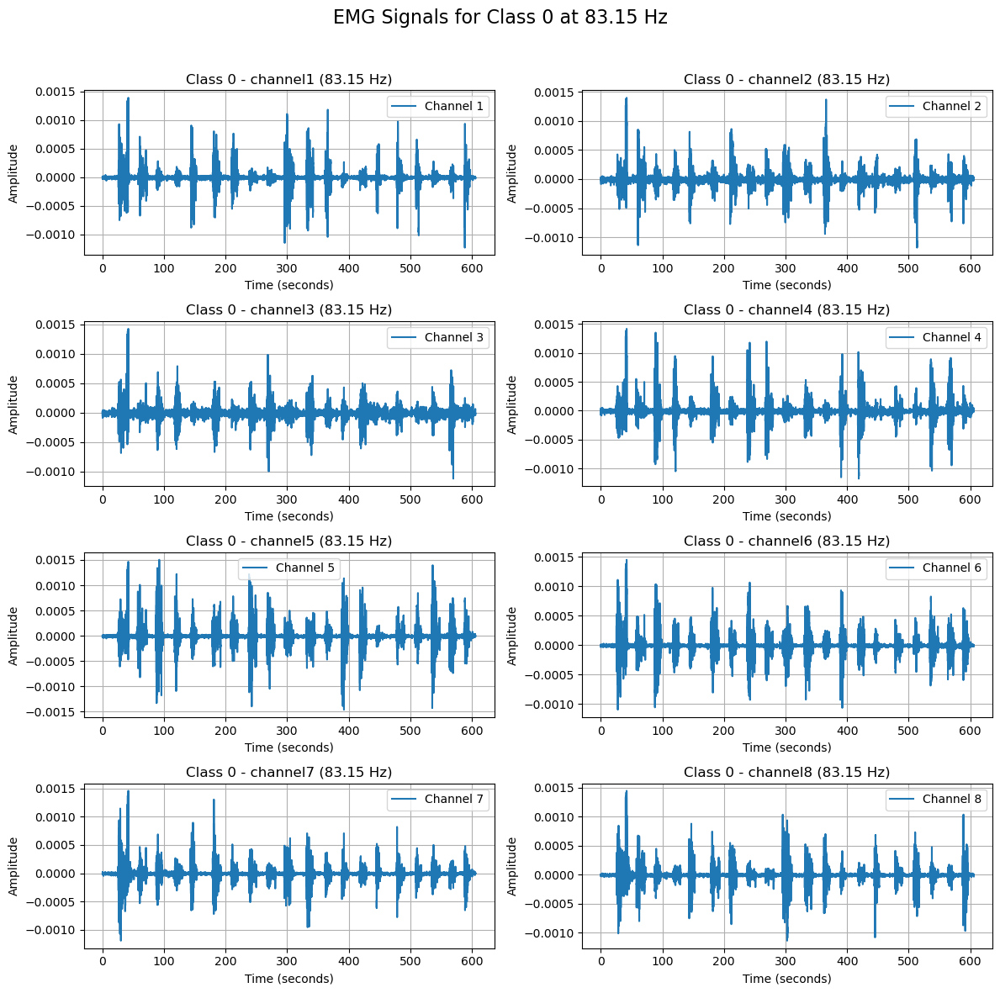

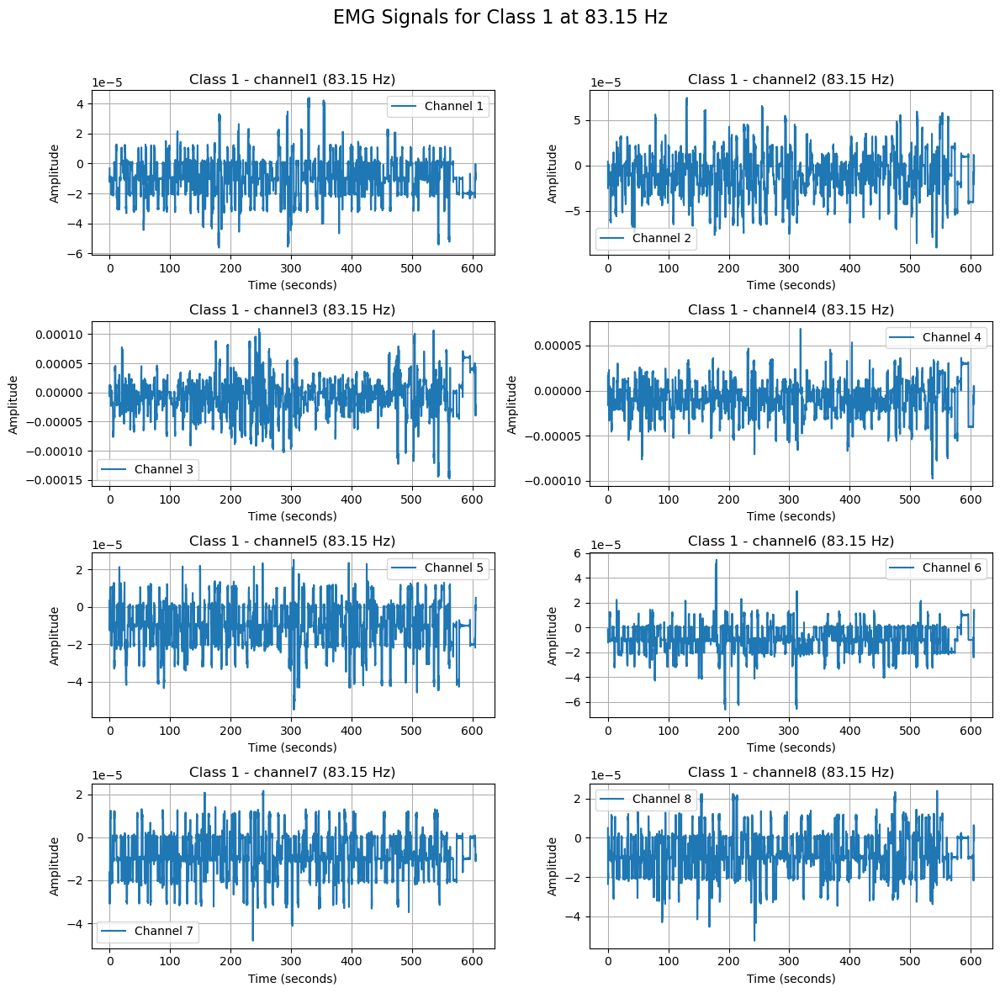

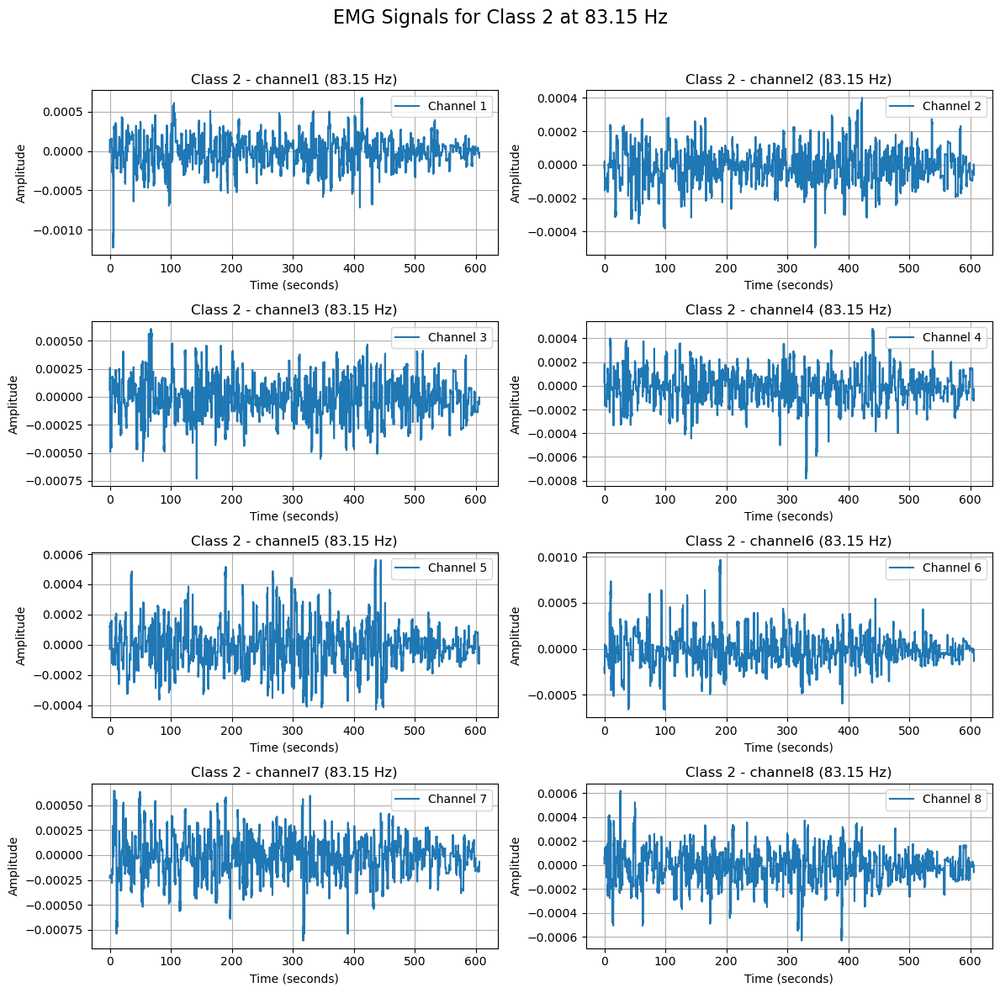

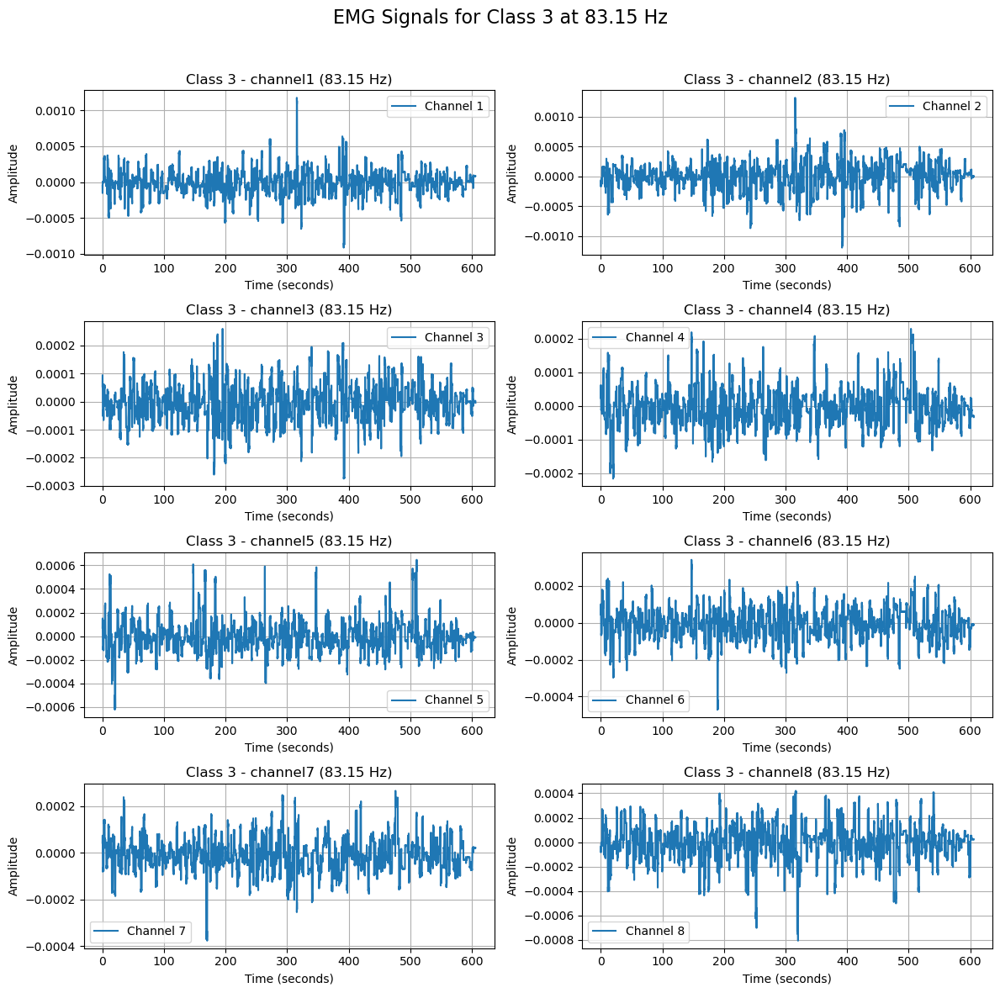

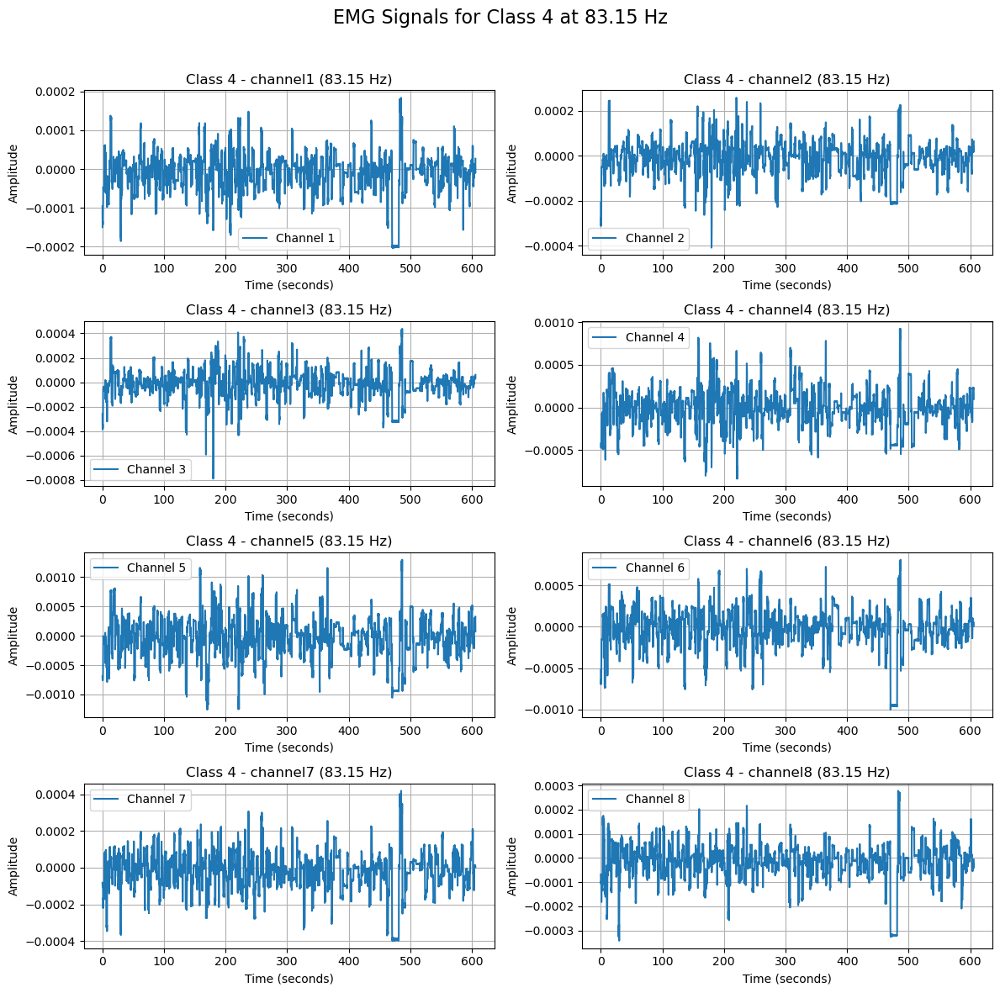

...

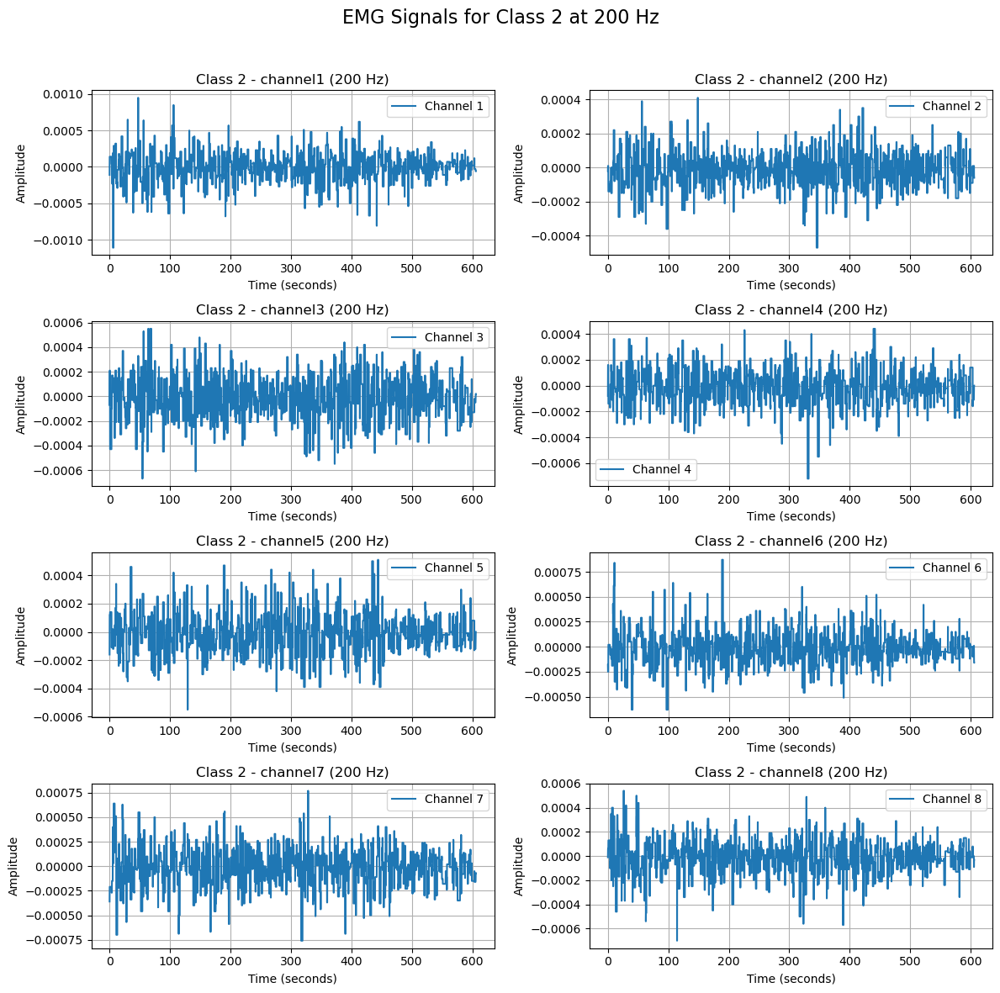

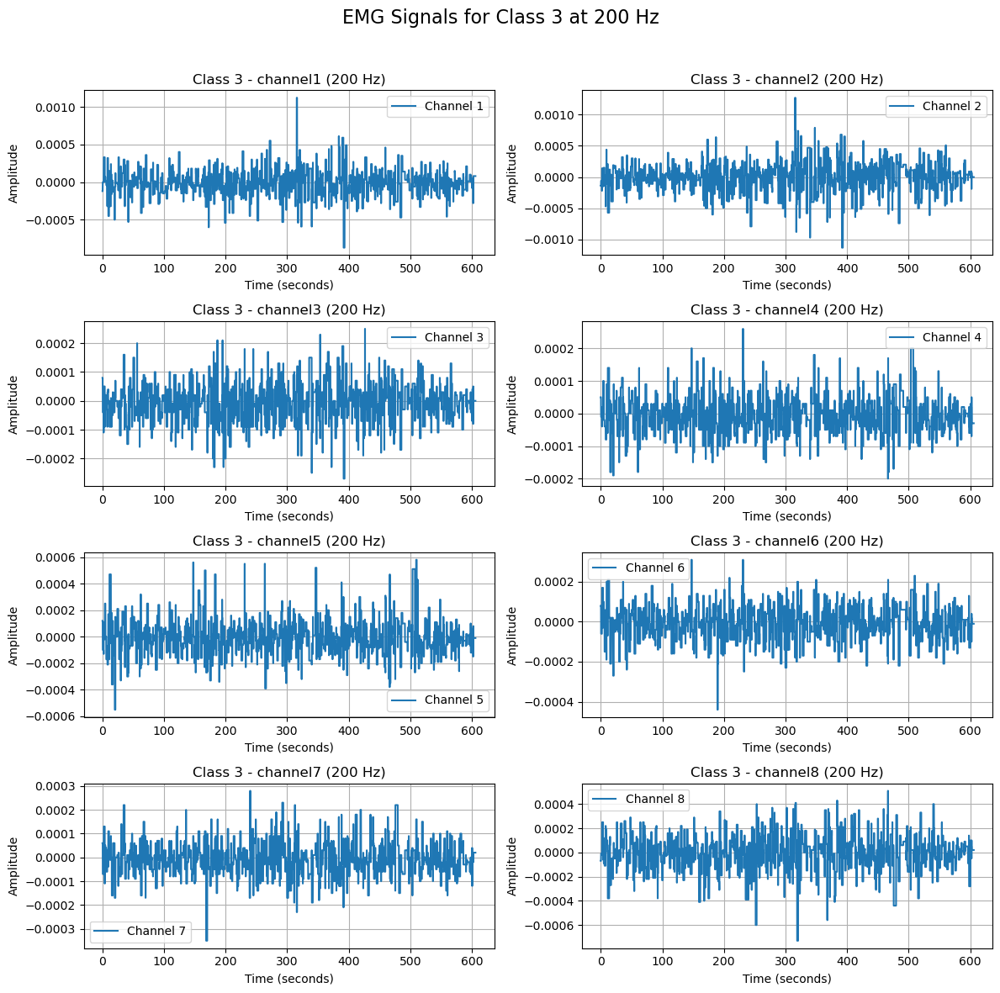

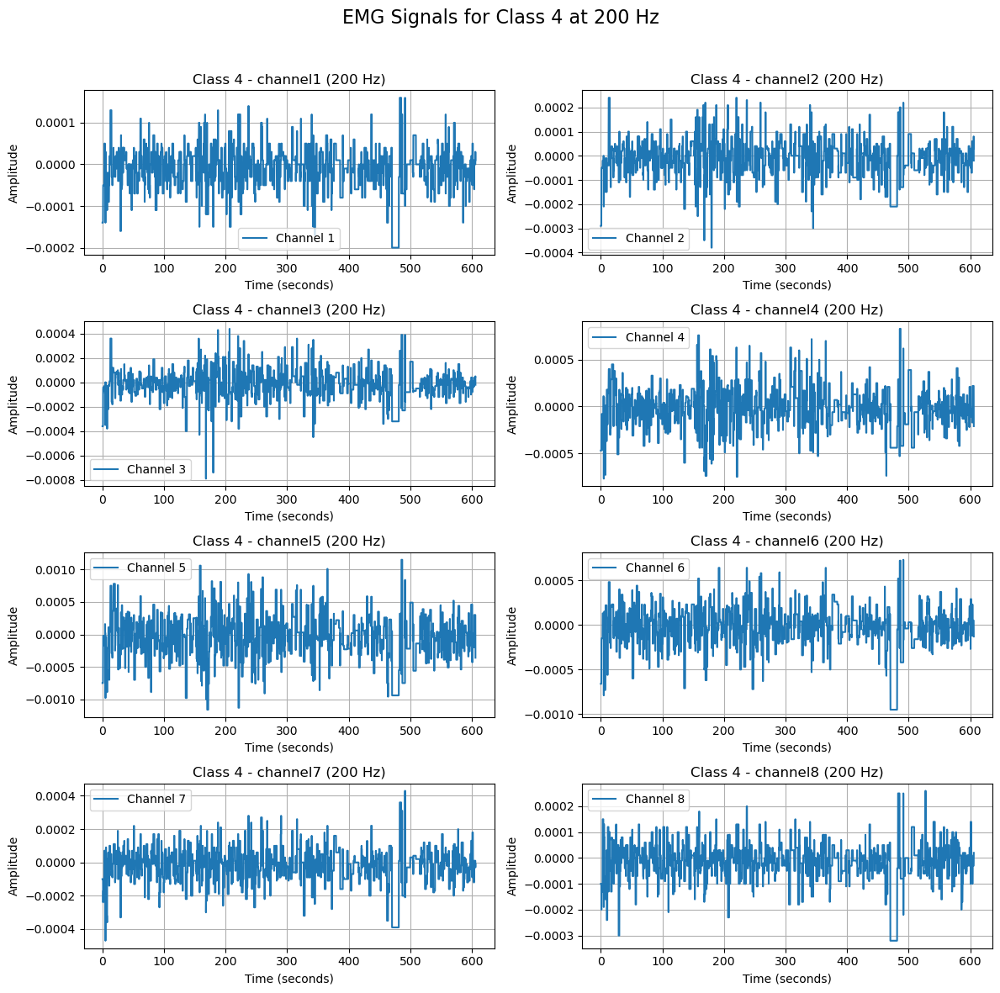

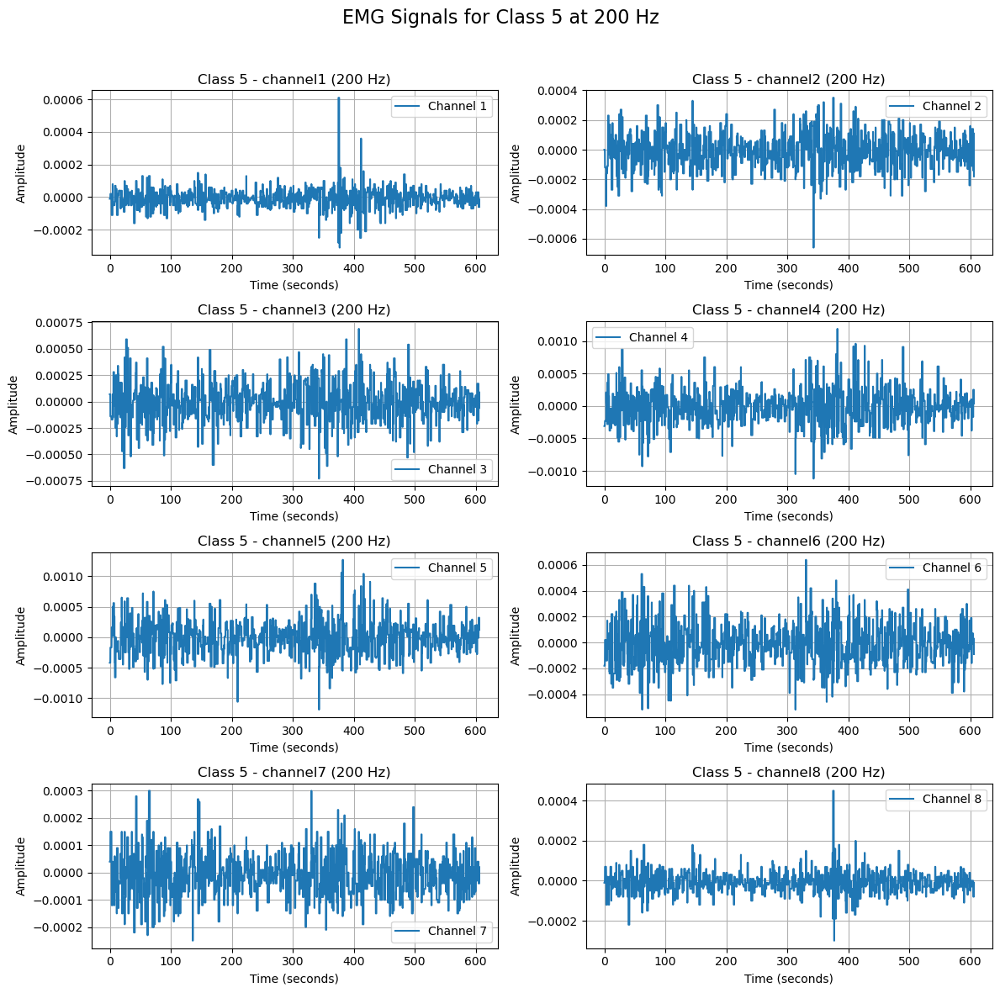

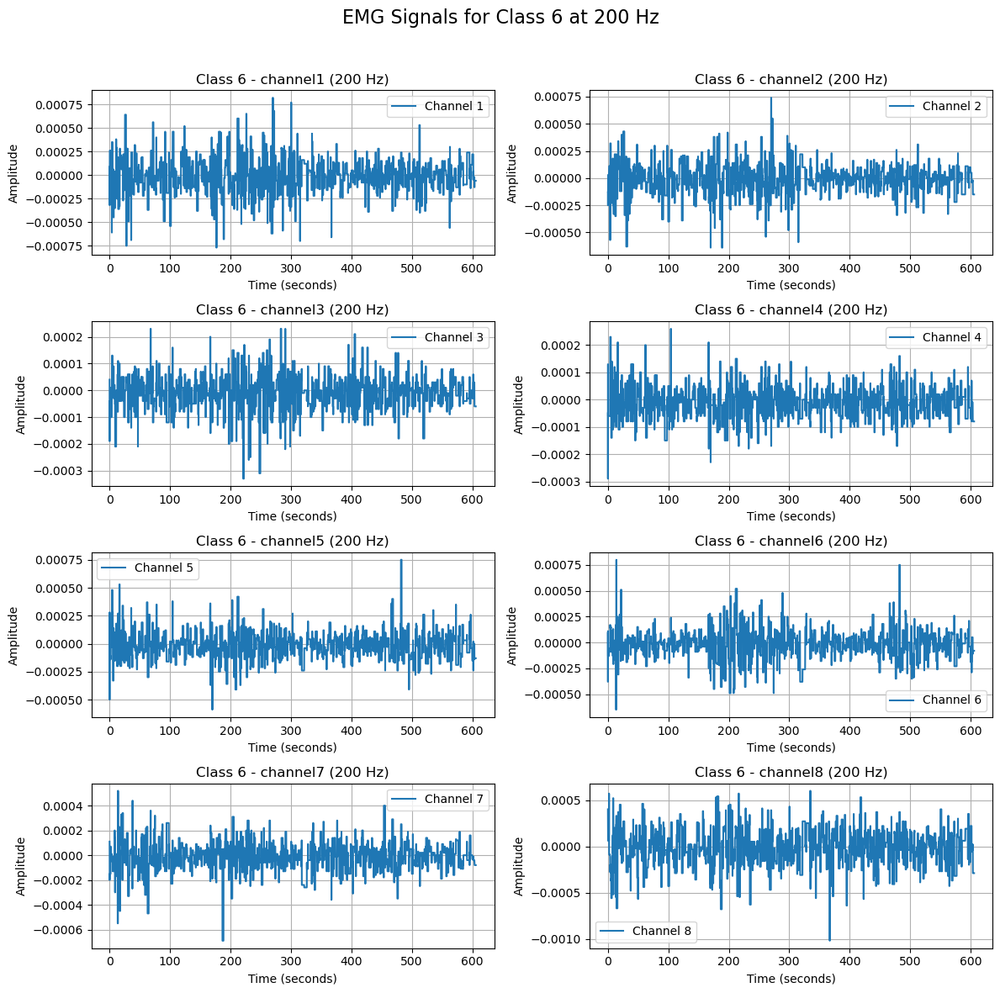

In [25]:
%matplotlib inline
import matplotlib.pyplot as plt
from scipy.signal import resample

# Define channels and sampling rates
emg_channels = [f'channel{i}' for i in range(1, 9)]
original_sample_rate = 200  # Assuming original sample rate is 200 Hz
target_sample_rates = [83.15, 200]  # Resample to both 83.15 Hz and 200 Hz

# Filter data for label 1
df_label1 = df[df['label'] == 1]

# Time vector for the original signal
time_original = np.arange(len(df_label1)) / original_sample_rate

# Loop over target sample rates
for sample_rate in target_sample_rates:
    # Loop over each class (0 to 7)
    for class_id in range(8):
        # Filter data for the specific class
        class_data = df_label1[df_label1['class'] == class_id]

        if class_data.empty:
            continue  # Skip if no data for this class

        plt.figure(figsize=(12, 12))

        # Resampling factor
        num_samples = int(len(class_data) * (sample_rate / original_sample_rate))

        for i, channel in enumerate(emg_channels, start=1):
            # Extract original signal
            signal_original = class_data[channel].values
            
            # Resample signal and time
            signal_resampled = resample(signal_original, num_samples)
            time_resampled = np.linspace(time_original[0], time_original[-1], num_samples)

            # Create subplot
            plt.subplot(4, 2, i)
            plt.plot(time_resampled, signal_resampled, label=f'Channel {i}')
            plt.xlabel("Time (seconds)")
            plt.ylabel("Amplitude")
            plt.title(f"Class {class_id} - {channel} ({sample_rate} Hz)")
            plt.legend()
            plt.grid(True)

        plt.suptitle(f"EMG Signals for Class {class_id} at {sample_rate} Hz", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout
        plt.show()

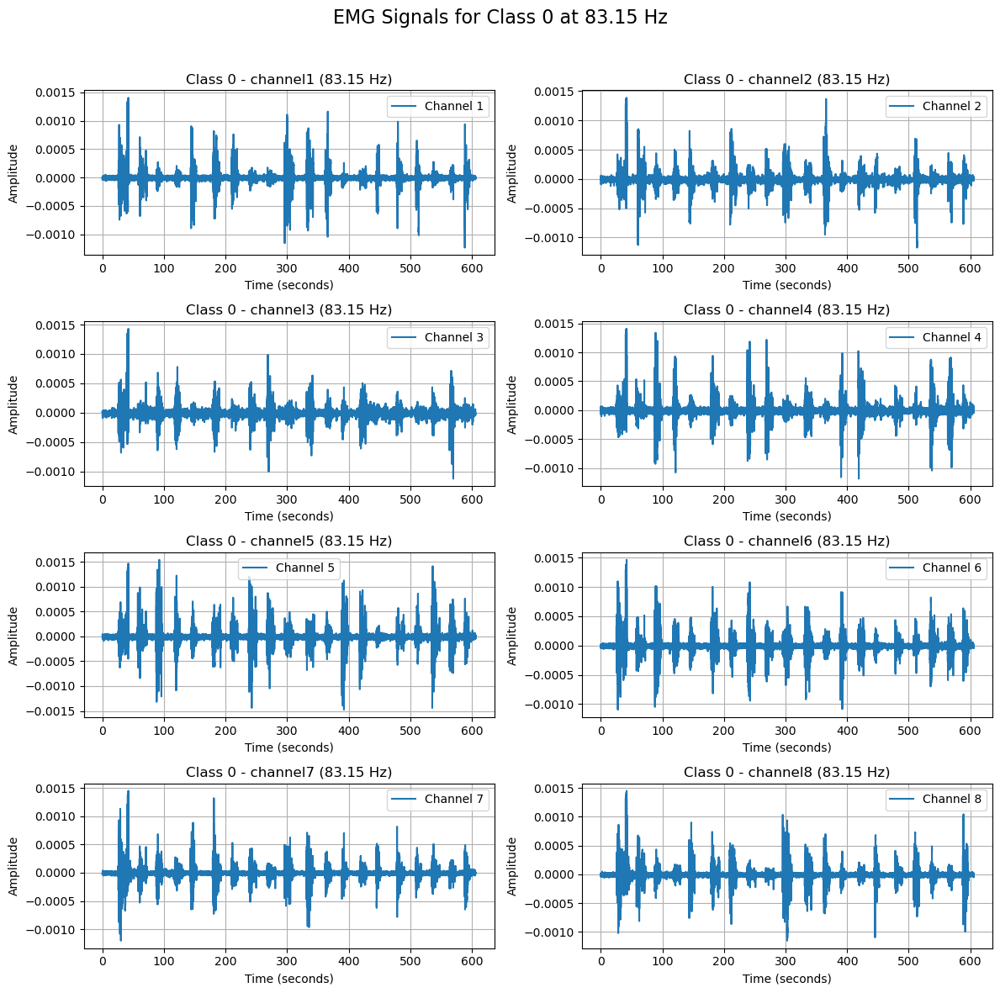

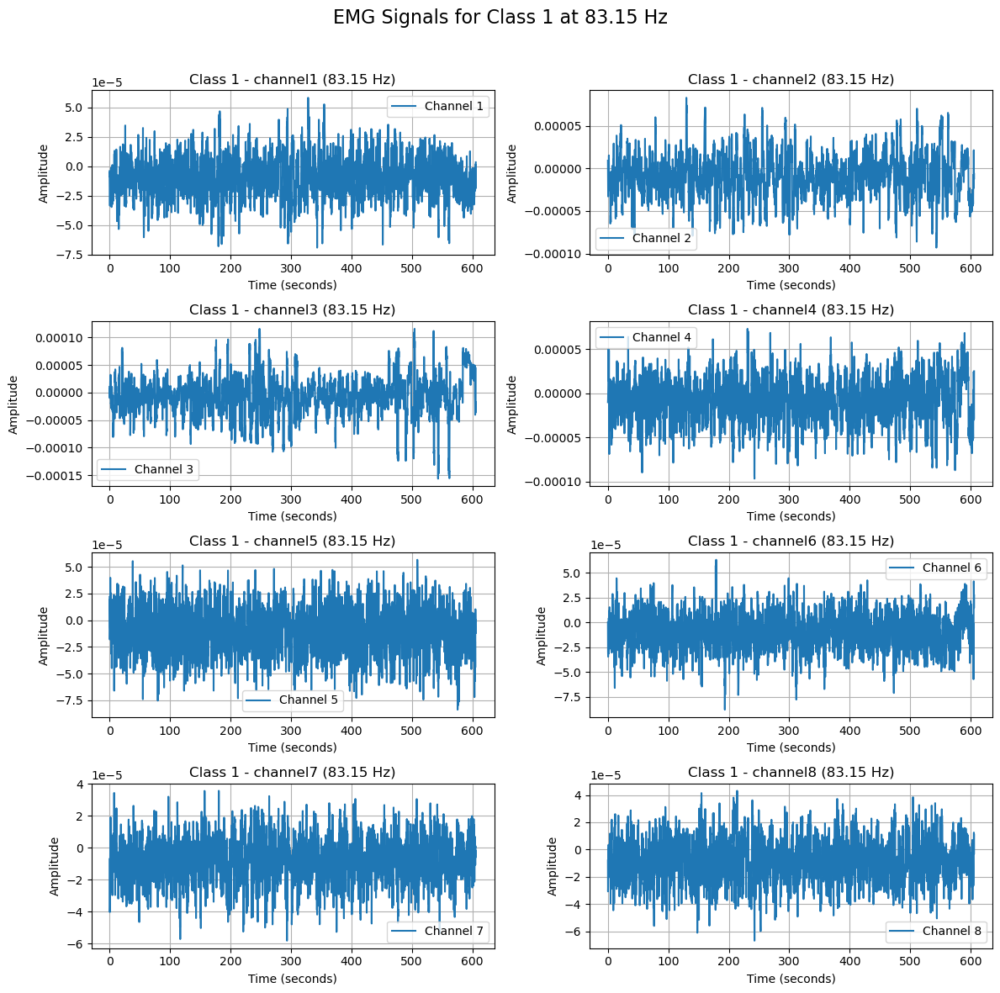

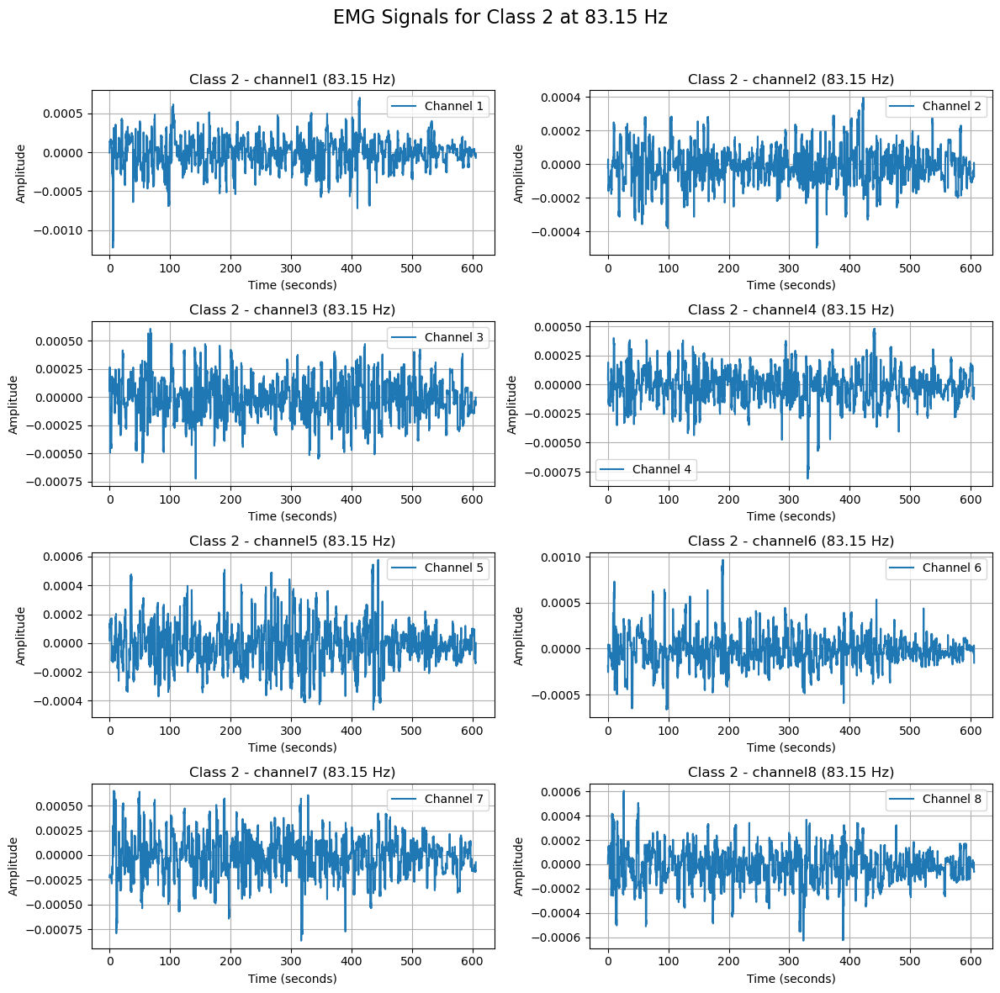

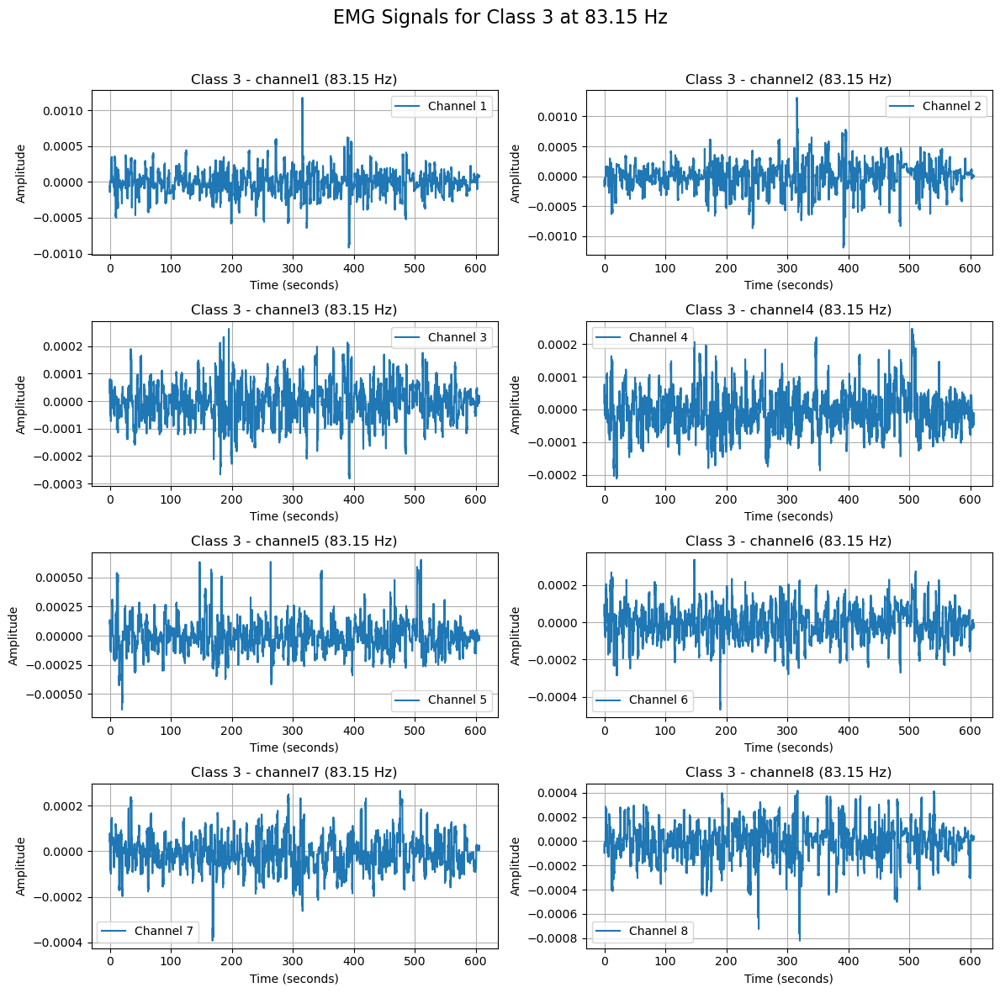

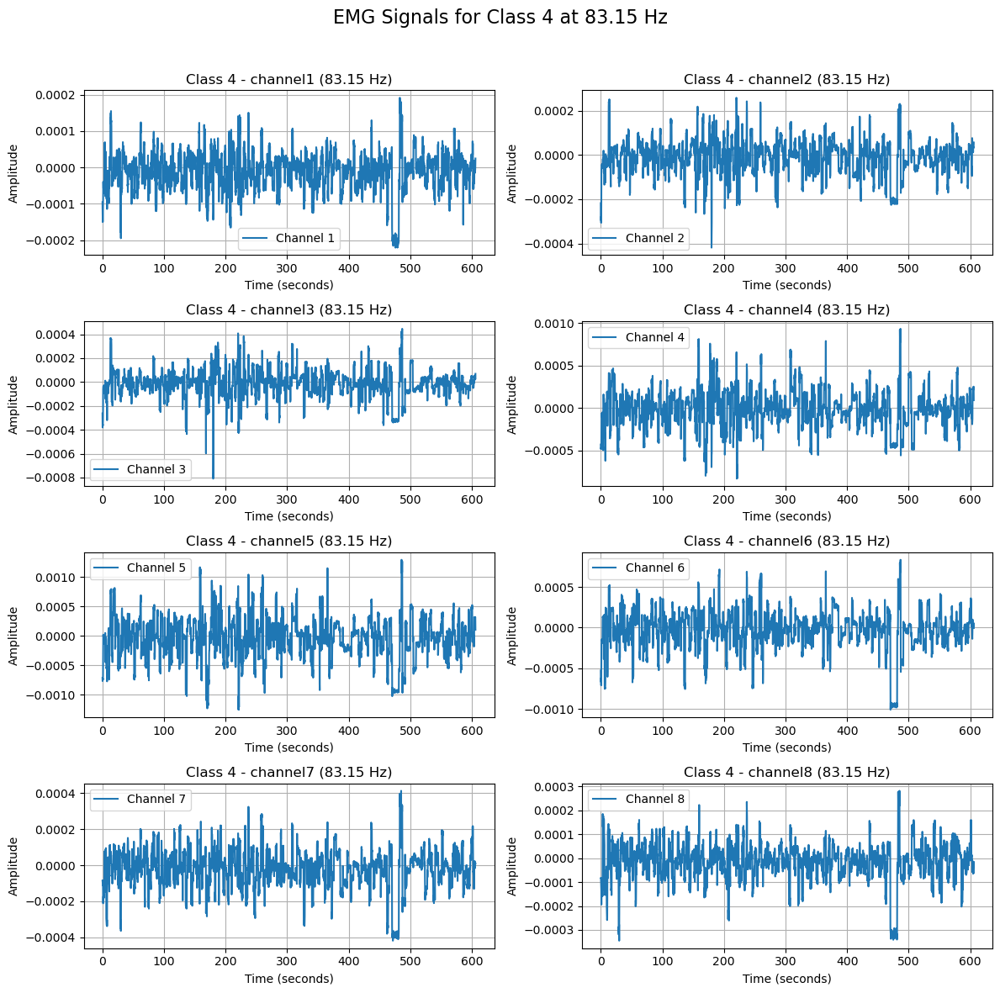

...

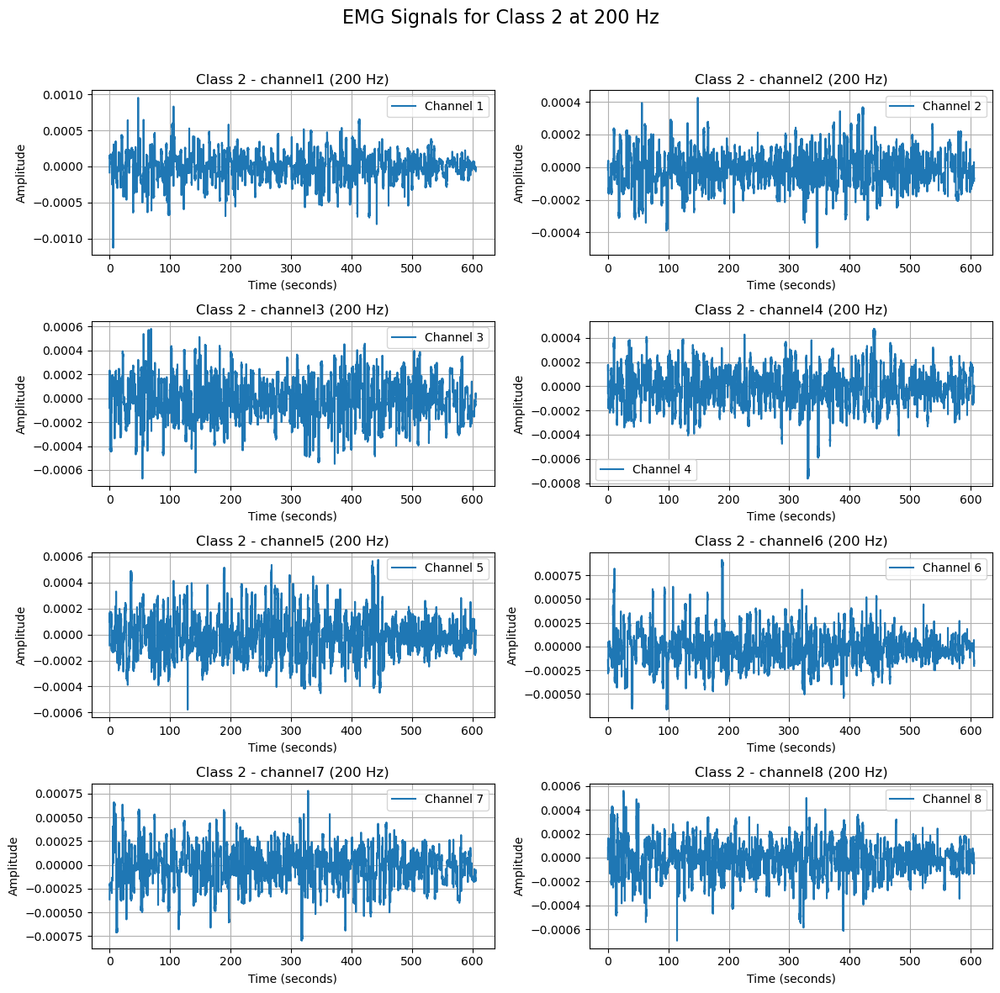

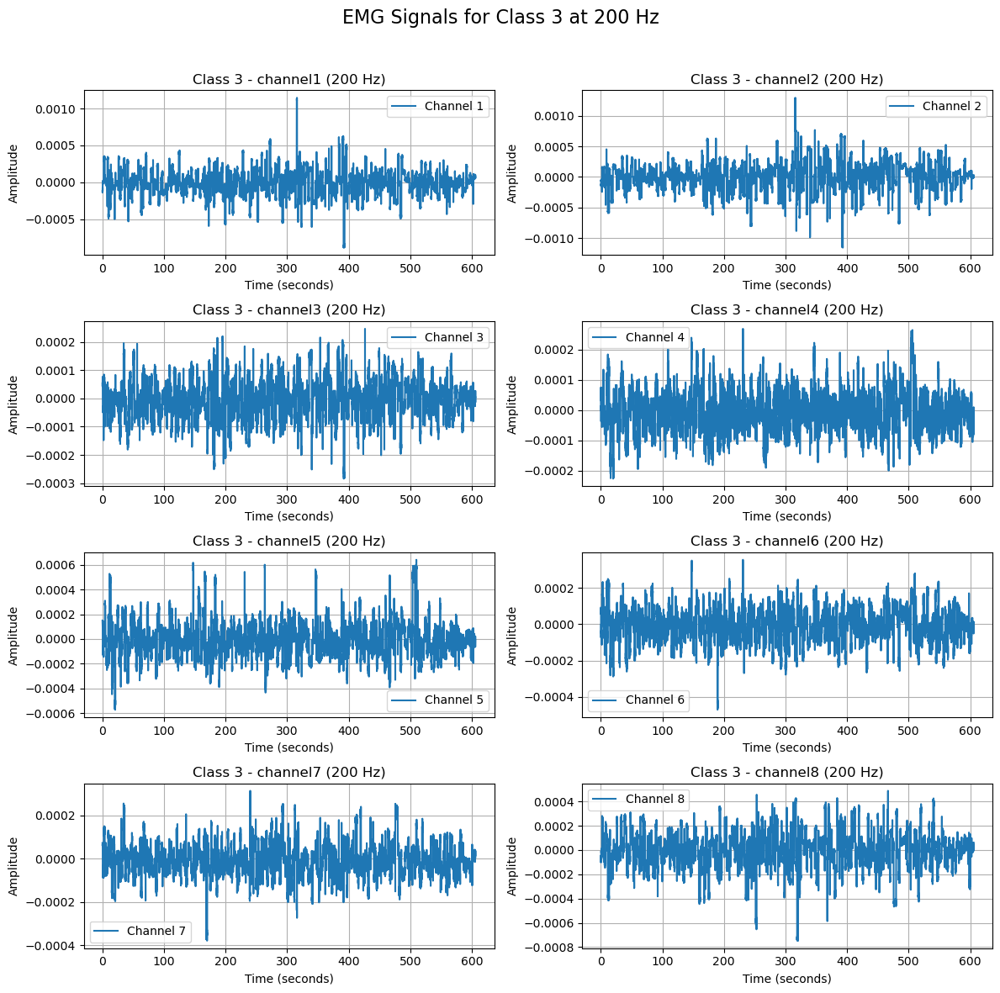

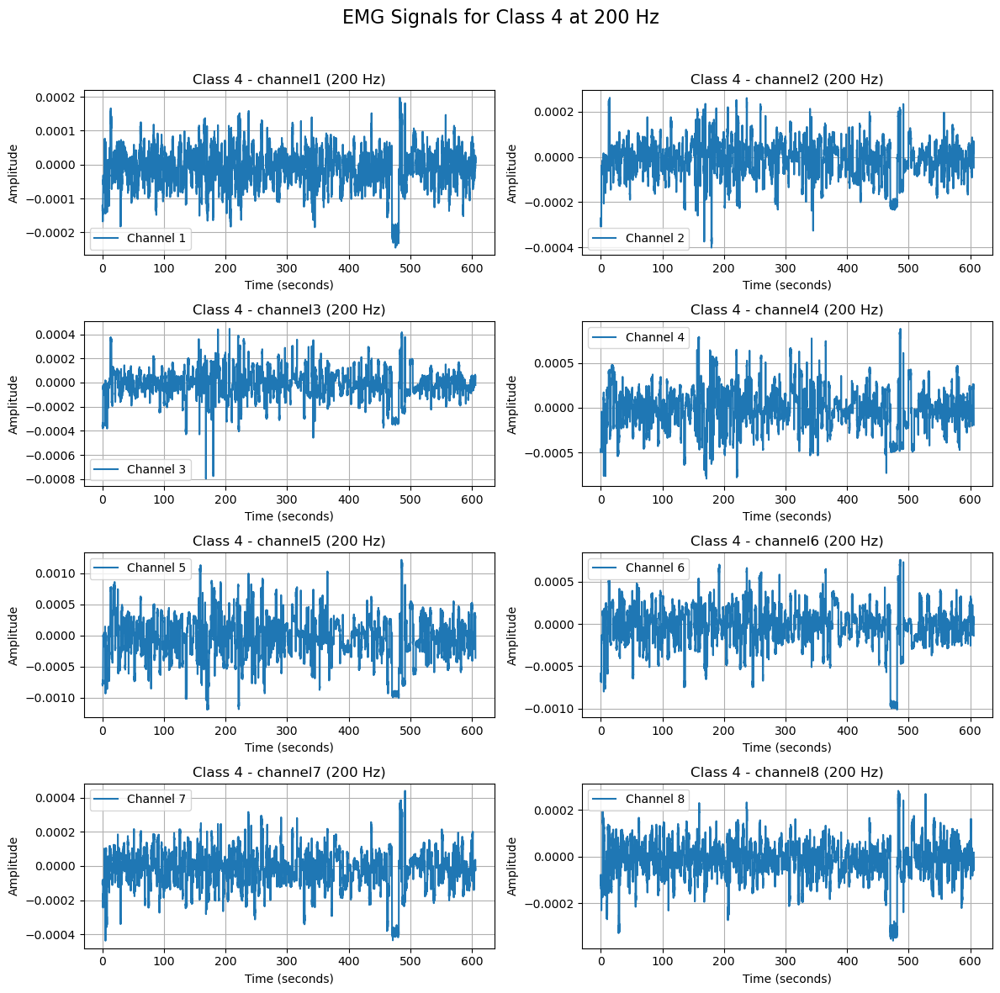

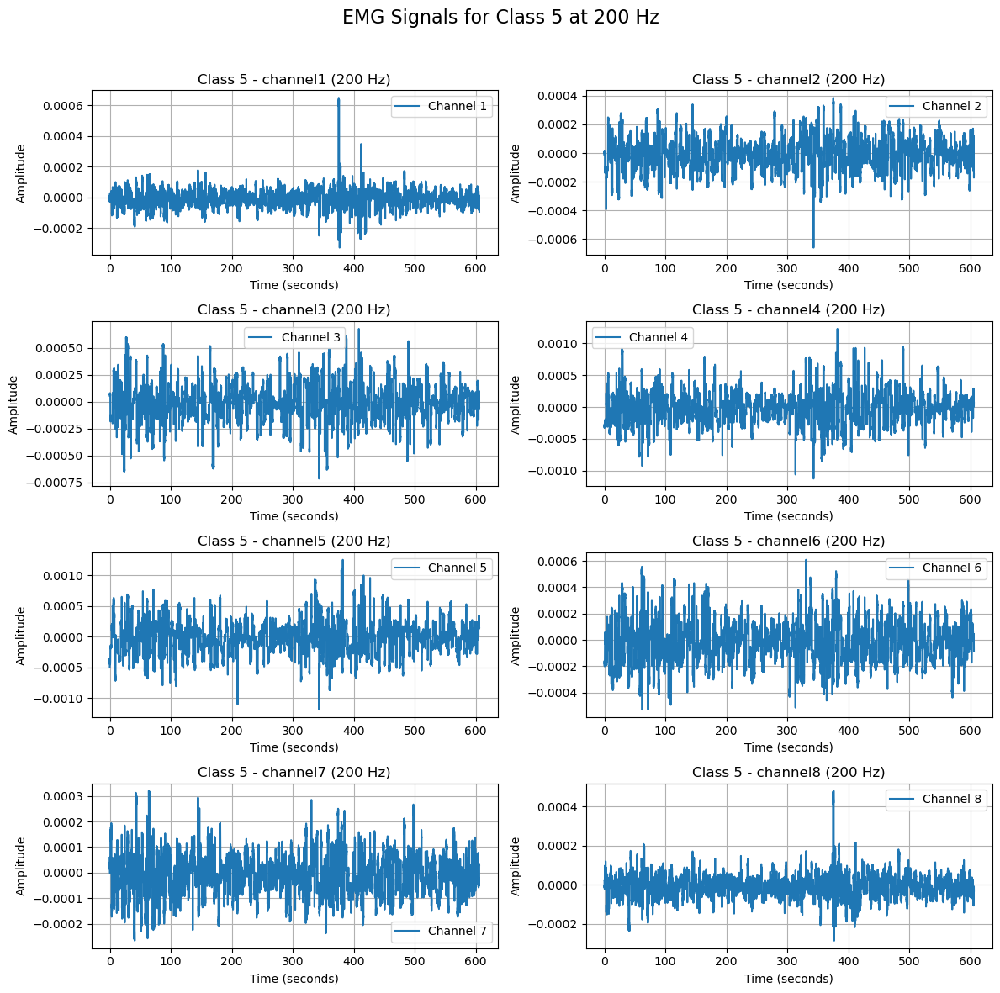

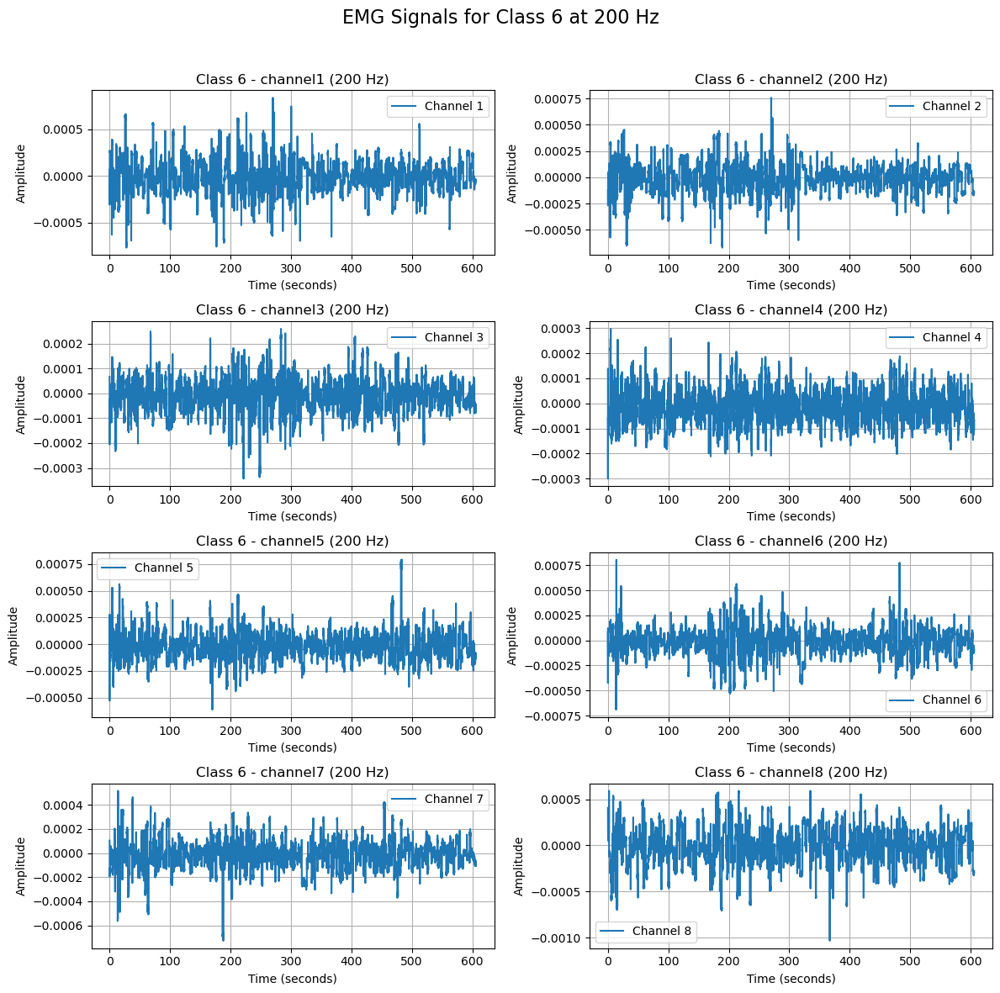

In [26]:
%matplotlib inline
import matplotlib.pyplot as plt
from scipy.signal import resample

# Define channels and sampling rates
emg_channels = [f'channel{i}' for i in range(1, 9)]
original_sample_rate = 200  # Assuming original sample rate is 200 Hz
target_sample_rates = [83.15, 200]  # Resample to both 83.15 Hz and 200 Hz

# Filter data for label 1
df_label1 = df_noisy[df_noisy['label'] == 1]

# Time vector for the original signal
time_original = np.arange(len(df_label1)) / original_sample_rate

# Loop over target sample rates
for sample_rate in target_sample_rates:
    # Loop over each class (0 to 7)
    for class_id in range(8):
        # Filter data for the specific class
        class_data = df_label1[df_label1['class'] == class_id]

        if class_data.empty:
            continue  # Skip if no data for this class

        plt.figure(figsize=(12, 12))

        # Resampling factor
        num_samples = int(len(class_data) * (sample_rate / original_sample_rate))

        for i, channel in enumerate(emg_channels, start=1):
            # Extract original signal
            signal_original = class_data[channel].values
            
            # Resample signal and time
            signal_resampled = resample(signal_original, num_samples)
            time_resampled = np.linspace(time_original[0], time_original[-1], num_samples)

            # Create subplot
            plt.subplot(4, 2, i)
            plt.plot(time_resampled, signal_resampled, label=f'Channel {i}')
            plt.xlabel("Time (seconds)")
            plt.ylabel("Amplitude")
            plt.title(f"Class {class_id} - {channel} ({sample_rate} Hz)")
            plt.legend()
            plt.grid(True)

        plt.suptitle(f"EMG Signals for Class {class_id} at {sample_rate} Hz", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout
        plt.show()

In [44]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# Drop non-feature columns to get X
X = df_noisy.drop(['time', 'class', 'label'], axis=1)
y = df_noisy['class']  # or 'labels', depending on your target

In [45]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
svm = SVC(kernel='rbf')  # You can change kernel as needed
svm.fit(X_train, y_train)

In [ ]:
y_pred = svm.predict(X_test)
print(classification_report(y_test, y_pred))

Apply bandpass (20–500 Hz) and notch (50 Hz) filtering to remove noise and artifacts.

In [41]:
import numpy as np
from scipy.signal import butter, filtfilt, iirnotch

def preprocess_emg(signal, fs):
    """Apply bandpass (20-500 Hz) and notch (50 Hz) filtering."""
    # Bandpass filter (20-500 Hz)
    nyq = 0.5 * fs
    low, high = 20 / nyq, 90 / nyq
    b, a = butter(4, [low, high], btype='band')
    filtered = filtfilt(b, a, signal)
    
    # Notch filter (50 Hz)
    f0 = 50.0
    Q = 30.0
    b_notch, a_notch = iirnotch(f0, Q, fs)
    filtered = filtfilt(b_notch, a_notch, filtered)
    
    return filtered


In [42]:
raw_emg = df_noisy.iloc[:, 3:11].values  # Replace with your EMG data
fs = 200  # Replace with your actual sampling frequency
raw_emg.shape


filtered_emg = preprocess_emg(raw_emg, fs)

ValueError: The length of the input vector x must be greater than padlen, which is 27.

In [ ]:
from scipy import signal

def extract_time_features(window):
    """Compute MAV, RMS, ZC, SSC, WL for a window."""
    # MAV: Mean Absolute Value
    mav = np.mean(np.abs(window))
    
    # RMS: Root Mean Square
    rms = np.sqrt(np.mean(window**2))
    
    # ZC: Zero Crossings (with threshold)
    threshold = 0.01
    zc = ((window[:-1] * window[1:]) < 0) & (np.abs(window[:-1] - window[1:]) > threshold)
    zc = np.sum(zc)
    
    # SSC: Slope Sign Changes (with threshold)
    delta = np.diff(window)
    ssc = ((delta[:-1] * delta[1:]) < 0) & (np.abs(delta[:-1] - delta[1:]) > threshold)
    ssc = np.sum(ssc)
    
    # WL: Waveform Length
    wl = np.sum(np.abs(np.diff(window)))
    
    return [mav, rms, zc, ssc, wl]

In [14]:
def segment_signal(signal, fs, window_size=0.2, overlap=0.5):
    """Segment signal into windows (window_size in seconds)."""
    window_samples = int(window_size * fs)
    step = int(window_samples * (1 - overlap))
    windows = []
    for i in range(0, len(signal) - window_samples, step):
        windows.append(signal[i:i+window_samples])
    return windows

# Example usage:
fs = 2000  # Sampling rate (Hz)
emg_clean = preprocess_emg(df, fs)
windows = segment_signal(emg_clean, fs)
time_features = [extract_time_features(win) for win in windows]  # Shape: [n_windows, 5]

NameError: name 'preprocess_emg' is not defined

In [ ]:
import librosa

def create_spectrogram(signal, fs, n_fft=1024, hop_length=512, target_shape=(128, 128)):
    """Generate a resized STFT spectrogram."""
    S = librosa.stft(signal, n_fft=n_fft, hop_length=hop_length)
    S_db = librosa.amplitude_to_db(np.abs(S), ref=np.max)
    S_resized = resize(S_db, target_shape, anti_aliasing=True)  # Resize to 128x128
    return S_resized

# Example for one window:
spectrogram = create_spectrogram(window, fs)

In [ ]:
def extract_mfcc(signal, fs, n_mfcc=13):
    """Extract MFCCs and their derivatives."""
    mfcc = librosa.feature.mfcc(y=signal, sr=fs, n_mfcc=n_mfcc)
    mfcc_delta = librosa.feature.delta(mfcc)
    mfcc_delta2 = librosa.feature.delta(mfcc, order=2)
    return np.vstack([mfcc, mfcc_delta, mfcc_delta2])  # Stack coefficients

In [ ]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(time_features, labels)  # Applies to time_features

In [ ]:
def augment_emg(signal, fs):
    """Apply Gaussian noise, time warping, and channel permutation."""
    # Gaussian noise injection
    noise = np.random.normal(0, 0.05, len(signal))
    augmented = signal + noise
    
    # Time warping (using cubic spline interpolation)
    warp_factor = np.random.uniform(0.8, 1.2)
    warped = librosa.effects.time_stretch(augmented, rate=warp_factor)
    
    return warped

# Channel permutation (for multi-channel EMG)
def permute_channels(data):
    """Randomly permute EMG channels."""
    return data[:, np.random.permutation(data.shape[1])]